In [1]:
import pathlib as Path
import pandas as pd
import os

import glob

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [2]:
exp_parquet_path = "/data/kelpschdj/iNDI/Production/Organelle_segmentation/output/organelle_features/2b1c31ad-579d-4ea6-a782-251ea083ed6a_organelle_features_20260727.parquet"

exp_parquet = pd.read_parquet(exp_parquet_path)
print(exp_parquet.head())

print(exp_parquet.columns.tolist())


                         Measurement_ID subdirectory  Row  Column  Frame  \
0  2b1c31ad-579d-4ea6-a782-251ea083ed6a       r01c01    1       1     20   
1  2b1c31ad-579d-4ea6-a782-251ea083ed6a       r01c01    1       1     20   
2  2b1c31ad-579d-4ea6-a782-251ea083ed6a       r01c01    1       1     20   
3  2b1c31ad-579d-4ea6-a782-251ea083ed6a       r01c01    1       1     20   
4  2b1c31ad-579d-4ea6-a782-251ea083ed6a       r01c01    1       1     20   

   Plane  Time              DAPI_filename           channel_filename  \
0      1     1  r01c01f20p01-ch01t01.tiff  r01c01f20p01-ch04t01.tiff   
1      1     1  r01c01f20p01-ch01t01.tiff  r01c01f20p01-ch04t01.tiff   
2      1     1  r01c01f20p01-ch01t01.tiff  r01c01f20p01-ch04t01.tiff   
3      1     1  r01c01f20p01-ch01t01.tiff  r01c01f20p01-ch04t01.tiff   
4      1     1  r01c01f20p01-ch01t01.tiff  r01c01f20p01-ch02t01.tiff   

  Structure  Stain  Nucleus_ID  area_px  organelle_count  \
0  Endosome   EEA1           3      234           

In [3]:
files = glob.glob("/data/kelpschdj/iNDI/Production/Organelle_segmentation/output/organelle_features/*_organelle_features_*.parquet")

parts = []
for f in files:
    part = pd.read_parquet(f)
    parts.append(part)
    print(f"{os.path.basename(f)}: {len(part)} rows")

df = pd.concat(parts, ignore_index=True)

print(f"\nLoaded {len(files)} files, {len(df)} total rows")
print(df.head())
print(df.columns.tolist())

028ebee9-afaf-4ff8-b435-af11714285dc_organelle_features_20260727.parquet: 116923 rows
07fc5da6-9d7d-4c97-858b-4b76df1859a5_organelle_features_20260727.parquet: 115825 rows
2350e82d-40dd-4bb4-93de-44edec0d1718_organelle_features_20260727.parquet: 138260 rows
2b1c31ad-579d-4ea6-a782-251ea083ed6a_organelle_features_20260727.parquet: 206401 rows
2da14033-ab86-4f33-b4f7-ef375c80ce62_organelle_features_20260727.parquet: 166866 rows
32d75d22-bd17-4629-8257-a4056e3ffcee_organelle_features_20260727.parquet: 107047 rows
4405a3b2-6b88-49b1-91f3-992e09ccbd16_organelle_features_20260727.parquet: 131613 rows
51cf625a-9422-406f-aa9e-a9f1238d1b96_organelle_features_20260727.parquet: 177584 rows
72c0a713-b5d5-4cd4-a826-c556368ed1d1_organelle_features_20260727.parquet: 100661 rows
7e03b502-ad64-4090-a9e2-fc4c3ecdae11_organelle_features_20260727.parquet: 169399 rows
934f6de5-f58b-4a1e-b225-ac6414500bb7_organelle_features_20260727.parquet: 152295 rows
9697941f-11d4-43bb-8f50-d424c4e05c29_organelle_feature

In [4]:
## pull in metadata
plate_id_fn = "/data/CARDPB2/iNDI/Production/metadata/indi_plateID_to_folderID.csv"
plate_id = pd.read_csv(plate_id_fn)
print(plate_id.head())

automated_plates_fn = "/data/CARDPB2/iNDI/Production/metadata/all_automated_plates_combined.csv"
manual_plates_fn = "/data/CARDPB2/iNDI/Production/metadata/all_manual_plates_combined.csv"
automated_plate_md = pd.read_csv(automated_plates_fn)
manual_plates_md = pd.read_csv(manual_plates_fn)

print(automated_plate_md.head())
print(manual_plates_md.head())

auto_cols = automated_plate_md.columns.tolist()
man_cols = manual_plates_md.columns.tolist()

print("Only in automated:", [c for c in auto_cols if c not in man_cols])
print("Only in manual:   ", [c for c in man_cols if c not in auto_cols])

  iNDI_Plate_ID    Layout                             Folder_ID
0    INDI00002D  Plate002  2b1c31ad-579d-4ea6-a782-251ea083ed6a
1    INDI00007D  Plate007  d7e04b5c-a253-42ff-859f-2af0e6047a00
2    INDI00011D  Plate011  f8062781-891b-4688-a59e-fccbf48325cf
3    INDI00015D  Plate015  caef83c7-6b44-4b64-b8ec-e8d84ca6759d
4    INDI00019D  Plate019  c8f2dbbe-6632-4063-ab68-0b4fa37909af
  iNDI_Plate_ID Well_ID      Genotype_Name       JAX_ID Batch_Info  \
0    INDI00026D     A01  HNRNPA1 D262N HOM  JIPSC001038        NaN   
1    INDI00026D     A02  HNRNPA1 D262N HOM  JIPSC001038        NaN   
2    INDI00026D     A03  HNRNPA1 D262N REV  JIPSC001042        NaN   
3    INDI00026D     A04  HNRNPA1 D262N HOM  JIPSC001038        NaN   
4    INDI00026D     A05      PFN1 C71G HET  JIPSC001034        NaN   

      JAX_Code     Gene Variant Genotype          Gene_Var_Type  \
0  JIPSC001038  HNRNPA1   D262N  SNV/SNV  HNRNPA1_D262N_SNV/SNV   
1  JIPSC001038  HNRNPA1   D262N  SNV/SNV  HNRNPA1_D262N_SNV/S

In [5]:
# label each source before combining
automated_plate_md = automated_plate_md.copy()
manual_plates_md = manual_plates_md.copy()
automated_plate_md["prep_method"] = "automated"
manual_plates_md["prep_method"] = "manual"

# make sure the manual df uses the same column order
manual_plates_md = manual_plates_md.reindex(columns=automated_plate_md.columns)

# append rows
all_plates_md = pd.concat([automated_plate_md, manual_plates_md], ignore_index=True)

print(all_plates_md.columns.tolist())
print(all_plates_md.shape)
print(all_plates_md["prep_method"].value_counts())
print(df.columns.tolist())

['iNDI_Plate_ID', 'Well_ID', 'Genotype_Name', 'JAX_ID', 'Batch_Info', 'JAX_Code', 'Gene', 'Variant', 'Genotype', 'Gene_Var_Type', 'Cell_Line_Info', 'prep_method']
(8064, 12)
prep_method
automated    4992
manual       3072
Name: count, dtype: int64
['Measurement_ID', 'subdirectory', 'Row', 'Column', 'Frame', 'Plane', 'Time', 'DAPI_filename', 'channel_filename', 'Structure', 'Stain', 'Nucleus_ID', 'area_px', 'organelle_count', 'average_organelle_area', 'max_f_intensity', 'sum_f_intensity', 'mean_f_intensity', 'median_f_intensity', 'CoefOfVar_intensity']


In [6]:
print("df Measurement_ID sample:", df["Measurement_ID"].head(3).tolist())
print("plate_id Folder_ID sample:", plate_id["Folder_ID"].head(3).tolist())
print("df dtype:", df["Measurement_ID"].dtype, "| plate_id dtype:", plate_id["Folder_ID"].dtype)

# keep only the mapping columns you need
plate_id_map = plate_id[["Folder_ID", "iNDI_Plate_ID", "Layout"]].drop_duplicates("Folder_ID")

# optional: remove columns in df that would collide
df = df.drop(columns=["Folder_ID", "iNDI_Plate_ID", "Layout"], errors="ignore")

print("Folder_ID unique?", plate_id_map["Folder_ID"].is_unique)
print("Folder_IDs in plate_id:", plate_id_map["Folder_ID"].nunique())

df_ids = set(df["Measurement_ID"].unique())
map_ids = set(plate_id_map["Folder_ID"].unique())
print(f"df experiments: {len(df_ids)} | matched in map: {len(df_ids & map_ids)} | unmatched: {len(df_ids - map_ids)}")

df = df.merge(
    plate_id_map,
    left_on="Measurement_ID",
    right_on="Folder_ID",
    how="left",
    validate="many_to_one",
    suffixes=("", "")  # no overlap now, so no _x/_y
)

print(f"After merge: {len(df)} rows")
print(df.columns.tolist())

df Measurement_ID sample: ['028ebee9-afaf-4ff8-b435-af11714285dc', '028ebee9-afaf-4ff8-b435-af11714285dc', '028ebee9-afaf-4ff8-b435-af11714285dc']
plate_id Folder_ID sample: ['2b1c31ad-579d-4ea6-a782-251ea083ed6a', 'd7e04b5c-a253-42ff-859f-2af0e6047a00', 'f8062781-891b-4688-a59e-fccbf48325cf']
df dtype: object | plate_id dtype: object
Folder_ID unique? True
Folder_IDs in plate_id: 22
df experiments: 21 | matched in map: 21 | unmatched: 0
After merge: 2963636 rows
['Measurement_ID', 'subdirectory', 'Row', 'Column', 'Frame', 'Plane', 'Time', 'DAPI_filename', 'channel_filename', 'Structure', 'Stain', 'Nucleus_ID', 'area_px', 'organelle_count', 'average_organelle_area', 'max_f_intensity', 'sum_f_intensity', 'mean_f_intensity', 'median_f_intensity', 'CoefOfVar_intensity', 'Folder_ID', 'iNDI_Plate_ID', 'Layout']


In [7]:
# build Well_ID
import string
df["Well_ID"] = df.apply(
    lambda r: f"{string.ascii_uppercase[int(r['Row'])-1]}{int(r['Column']):02d}",
    axis=1,
)

# match-rate on the FULL composite key
df_keys = set(zip(df["iNDI_Plate_ID"], df["Well_ID"]))
md_keys = set(zip(all_plates_md["iNDI_Plate_ID"], all_plates_md["Well_ID"]))
print(f"df keys: {len(df_keys)} | matched: {len(df_keys & md_keys)} | unmatched: {len(df_keys - md_keys)}")

# metadata composite key unique?
print("md plate+well unique?",
      not all_plates_md.duplicated(["iNDI_Plate_ID", "Well_ID"]).any())

df = df.merge(
    all_plates_md,
    on=["iNDI_Plate_ID", "Well_ID"],
    how="left",
    validate="many_to_one",
)
print(f"After merge: {len(df)} rows")   # should be unchanged
print(df.columns.tolist())

df keys: 6352 | matched: 6352 | unmatched: 0
md plate+well unique? True
After merge: 2963636 rows
['Measurement_ID', 'subdirectory', 'Row', 'Column', 'Frame', 'Plane', 'Time', 'DAPI_filename', 'channel_filename', 'Structure', 'Stain', 'Nucleus_ID', 'area_px', 'organelle_count', 'average_organelle_area', 'max_f_intensity', 'sum_f_intensity', 'mean_f_intensity', 'median_f_intensity', 'CoefOfVar_intensity', 'Folder_ID', 'iNDI_Plate_ID', 'Layout', 'Well_ID', 'Genotype_Name', 'JAX_ID', 'Batch_Info', 'JAX_Code', 'Gene', 'Variant', 'Genotype', 'Gene_Var_Type', 'Cell_Line_Info', 'prep_method']


In [8]:
print(df.columns.tolist())

['Measurement_ID', 'subdirectory', 'Row', 'Column', 'Frame', 'Plane', 'Time', 'DAPI_filename', 'channel_filename', 'Structure', 'Stain', 'Nucleus_ID', 'area_px', 'organelle_count', 'average_organelle_area', 'max_f_intensity', 'sum_f_intensity', 'mean_f_intensity', 'median_f_intensity', 'CoefOfVar_intensity', 'Folder_ID', 'iNDI_Plate_ID', 'Layout', 'Well_ID', 'Genotype_Name', 'JAX_ID', 'Batch_Info', 'JAX_Code', 'Gene', 'Variant', 'Genotype', 'Gene_Var_Type', 'Cell_Line_Info', 'prep_method']


In [9]:
df

,Measurement_ID,subdirectory,Row,Column,Frame,Plane,Time,DAPI_filename,channel_filename,Structure,...,Genotype_Name,JAX_ID,Batch_Info,JAX_Code,Gene,Variant,Genotype,Gene_Var_Type,Cell_Line_Info,prep_method
0,028ebee9-afaf-4ff8-b435-af11714285dc,r02c03,2,3,5,1,1,r02c03f05p01-ch01t01.tiff,r02c03f05p01-ch04t01.tiff,Endosome,...,Parental,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,manual
1,028ebee9-afaf-4ff8-b435-af11714285dc,r02c03,2,3,5,1,1,r02c03f05p01-ch01t01.tiff,r02c03f05p01-ch04t01.tiff,Endosome,...,Parental,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,manual
2,028ebee9-afaf-4ff8-b435-af11714285dc,r02c03,2,3,5,1,1,r02c03f05p01-ch01t01.tiff,r02c03f05p01-ch04t01.tiff,Endosome,...,Parental,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,manual
3,028ebee9-afaf-4ff8-b435-af11714285dc,r02c03,2,3,5,1,1,r02c03f05p01-ch01t01.tiff,r02c03f05p01-ch04t01.tiff,Endosome,...,Parental,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,manual
4,028ebee9-afaf-4ff8-b435-af11714285dc,r02c03,2,3,5,1,1,r02c03f05p01-ch01t01.tiff,r02c03f05p01-ch02t01.tiff,Lysosome,...,Parental,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,manual
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2963631,f8062781-891b-4688-a59e-fccbf48325cf,r16c24,16,24,30,1,1,r16c24f30p01-ch01t01.tiff,r16c24f30p01-ch04t01.tiff,Endosome,...,PSEN2 N141I REV,JIPSC001054,NaN,JIPSC001054,PSEN2,N141I,REV/WT,PSEN2_N141I_REV/WT,JAX_ID_JIPSC001054\nPSEN2 N141I REV \nLow coun...,automated
2963632,f8062781-891b-4688-a59e-fccbf48325cf,r16c24,16,24,30,1,1,r16c24f30p01-ch01t01.tiff,r16c24f30p01-ch02t01.tiff,Lysosome,...,PSEN2 N141I REV,JIPSC001054,NaN,JIPSC001054,PSEN2,N141I,REV/WT,PSEN2_N141I_REV/WT,JAX_ID_JIPSC001054\nPSEN2 N141I REV \nLow coun...,automated
2963633,f8062781-891b-4688-a59e-fccbf48325cf,r16c24,16,24,30,1,1,r16c24f30p01-ch01t01.tiff,r16c24f30p01-ch02t01.tiff,Lysosome,...,PSEN2 N141I REV,JIPSC001054,NaN,JIPSC001054,PSEN2,N141I,REV/WT,PSEN2_N141I_REV/WT,JAX_ID_JIPSC001054\nPSEN2 N141I REV \nLow coun...,automated
2963634,f8062781-891b-4688-a59e-fccbf48325cf,r16c24,16,24,30,1,1,r16c24f30p01-ch01t01.tiff,r16c24f30p01-ch03t01.tiff,Mitochondria,...,PSEN2 N141I REV,JIPSC001054,NaN,JIPSC001054,PSEN2,N141I,REV/WT,PSEN2_N141I_REV/WT,JAX_ID_JIPSC001054\nPSEN2 N141I REV \nLow coun...,automated


In [15]:
for plate, grp in df.groupby('iNDI_Plate_ID'):
    print(f"\n{plate}")
    print(grp.groupby('Genotype_Name')['Well_ID'].nunique())


INDI00002D
Genotype_Name
FUS R459X HET    48
FUS R459X HOM    48
FUS R459X REV    48
Parental         96
VCP R159H HET    48
VCP R159H HOM    48
VCP R159H REV    48
Name: Well_ID, dtype: int64

INDI00007D
Genotype_Name
Parental            96
TARDBP M337V HET    48
TARDBP M337V REV    48
TARDBP Q331K HOM    47
TIA1 P351L HOM      48
TIA1 P351L REV      48
Name: Well_ID, dtype: int64

INDI00011D
Genotype_Name
FUS R216C HOM      47
PSEN2 N141I HOM    48
PSEN2 N141I REV    47
Parental           96
TBK1 E696K HET      2
TBK1 E696K HOM      4
TBK1 E696K REV      3
Name: Well_ID, dtype: int64

INDI00015D
Genotype_Name
APP A673T HET      48
APP A673T REV      48
APP E693G HET      48
APP E693G HOM      48
APP V717I HOM      48
PSEN1 E276A HET    48
Parental           48
Name: Well_ID, dtype: int64

INDI00019D
Genotype_Name
APP E693G REV      41
FUS R216C HET      47
FUS R216C REV      47
PSEN1 E276A HOM     4
PSEN1 E276A REV    47
PSEN2 N141I HET     2
Parental           95
Name: Well_ID, dty

In [71]:
FEATURES = [
    "area_px", 
    "organelle_count", 
    "average_organelle_area",
    # "max_f_intensity", 
    "sum_f_intensity", 
    "mean_f_intensity",
    # "median_f_intensity", 
    "CoefOfVar_intensity",
]

before = len(df)
X_df = df[FEATURES].replace([np.inf, -np.inf], np.nan)
corr = X_df.corr()   # X_df = your feature dataframe (raw, pre-scaling)
print(corr.round(2))

                        area_px  organelle_count  average_organelle_area  \
area_px                    1.00             0.73                    0.55   
organelle_count            0.73             1.00                   -0.00   
average_organelle_area     0.55            -0.00                    1.00   
sum_f_intensity            0.64             0.39                    0.40   
mean_f_intensity          -0.43            -0.37                   -0.25   
CoefOfVar_intensity        0.11            -0.03                    0.23   

                        sum_f_intensity  mean_f_intensity  CoefOfVar_intensity  
area_px                            0.64             -0.43                 0.11  
organelle_count                    0.39             -0.37                -0.03  
average_organelle_area             0.40             -0.25                 0.23  
sum_f_intensity                    1.00              0.26                 0.38  
mean_f_intensity                   0.26              1.00     

Dropped 0 rows with NaN/inf features; 2963636 remain


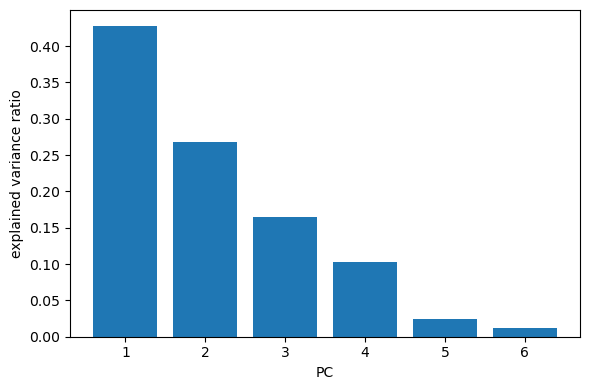

PC1-4 explain: [0.428 0.268 0.165 0.102] cumulative: [0.428 0.697 0.862 0.964]


In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# --- handle NaNs (empty ROIs give NaN intensity / CV) ---
before = len(df)
X_df = df[FEATURES].replace([np.inf, -np.inf], np.nan)
keep = X_df.notna().all(axis=1)
df = df[keep].reset_index(drop=True)
X_df = X_df[keep].reset_index(drop=True)
print(f"Dropped {before - len(df)} rows with NaN/inf features; {len(df)} remain")

# --- standardize + PCA ---
X = StandardScaler().fit_transform(X_df.values)
pca = PCA(n_components=len(FEATURES))
scores = pca.fit_transform(X)

df["PC1"], df["PC2"], df["PC3"] = scores[:, 0], scores[:, 1], scores[:, 2]

# --- scree ---
ev = pca.explained_variance_ratio_
plt.figure(figsize=(6, 4))
plt.bar(range(1, len(ev) + 1), ev)
plt.xlabel("PC"); plt.ylabel("explained variance ratio")
plt.tight_layout(); plt.show()
print("PC1-4 explain:", ev[:4].round(3), "cumulative:", np.cumsum(ev)[:4].round(3))

                          PC1    PC2    PC3    PC4    PC5    PC6
area_px                 0.603 -0.113 -0.035 -0.071  0.002  0.786
organelle_count         0.446 -0.276 -0.547  0.196 -0.487 -0.387
average_organelle_area  0.387  0.136  0.722 -0.248 -0.423 -0.265
sum_f_intensity         0.455  0.415 -0.236 -0.361  0.568 -0.334
mean_f_intensity       -0.233  0.622 -0.337 -0.367 -0.511  0.221
CoefOfVar_intensity     0.163  0.577  0.094  0.794  0.010  0.033


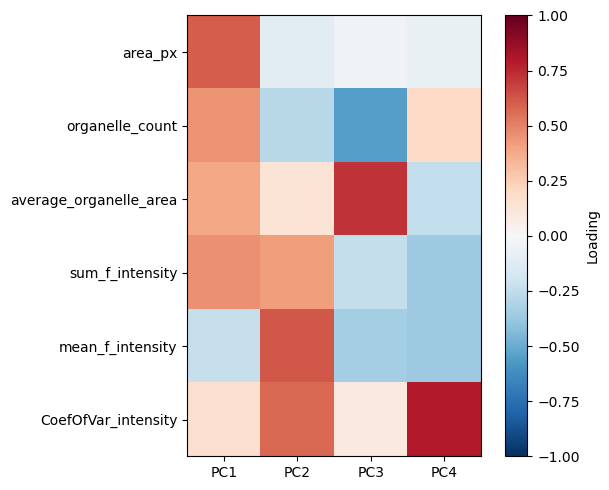

In [73]:
loadings = pd.DataFrame(
    pca.components_.T,
    index=FEATURES,
    columns=[f"PC{i+1}" for i in range(len(FEATURES))]
)

print(loadings.round(3))

plt.figure(figsize=(6,5))
plt.imshow(loadings.iloc[:, :4], cmap="RdBu_r", vmin=-1, vmax=1)
plt.xticks(range(4), ["PC1","PC2","PC3","PC4"])
plt.yticks(range(len(FEATURES)), FEATURES)
plt.colorbar(label="Loading")
plt.tight_layout()

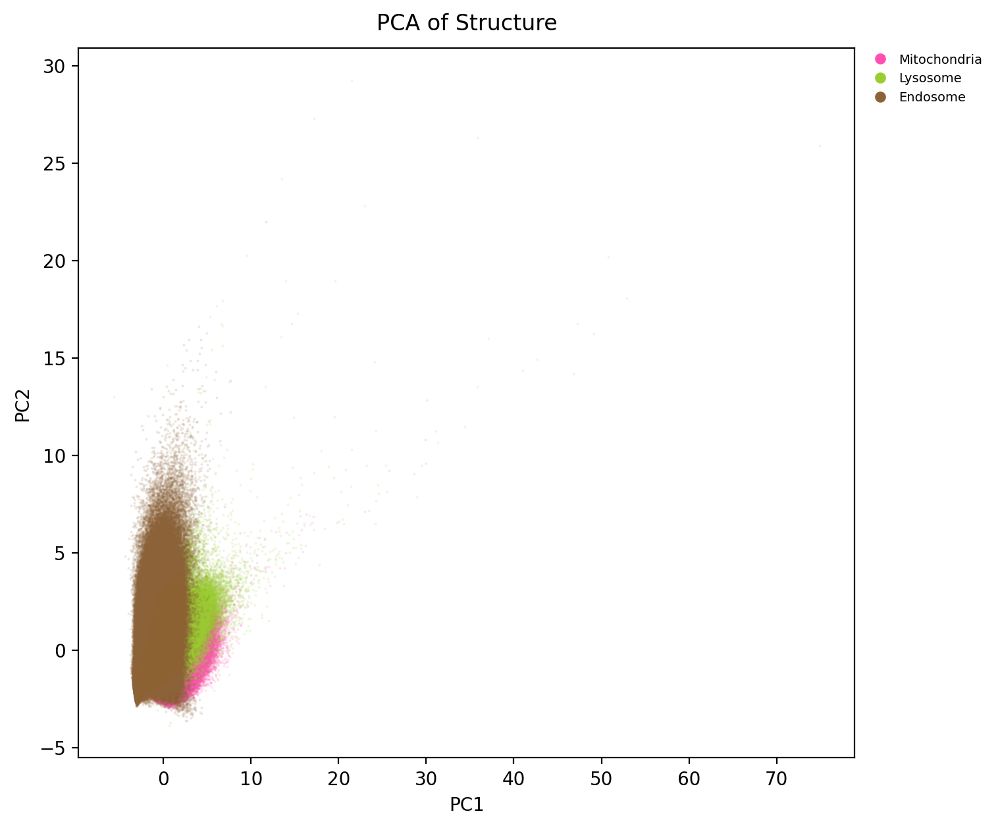

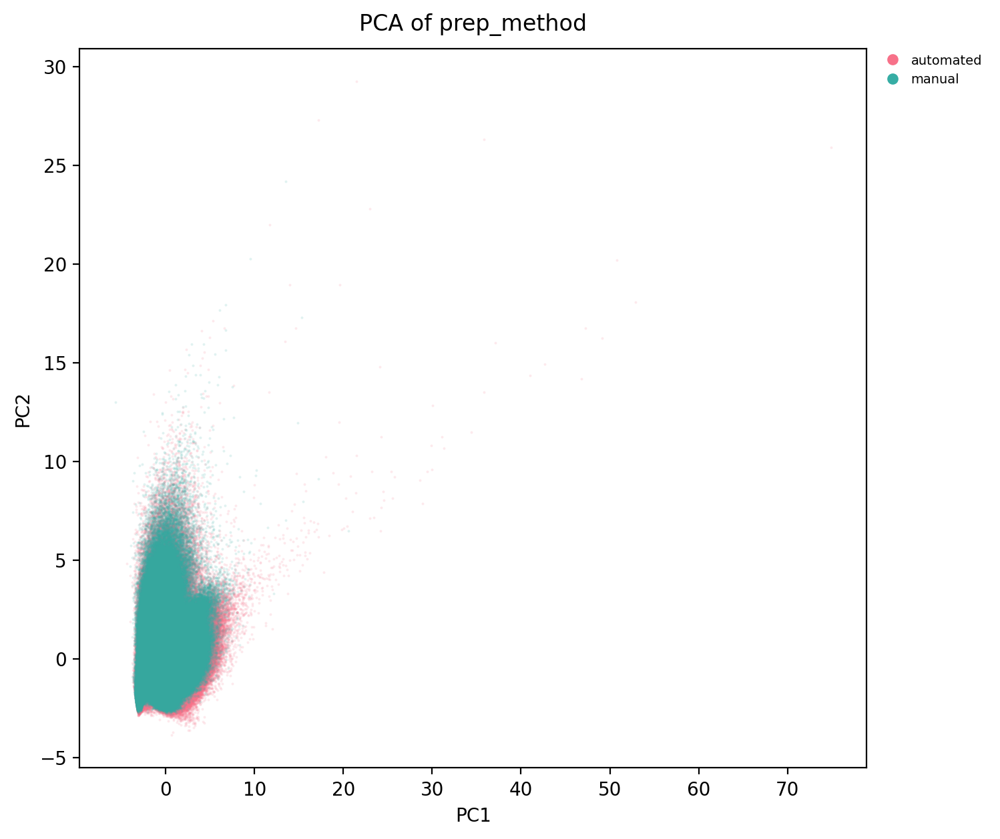

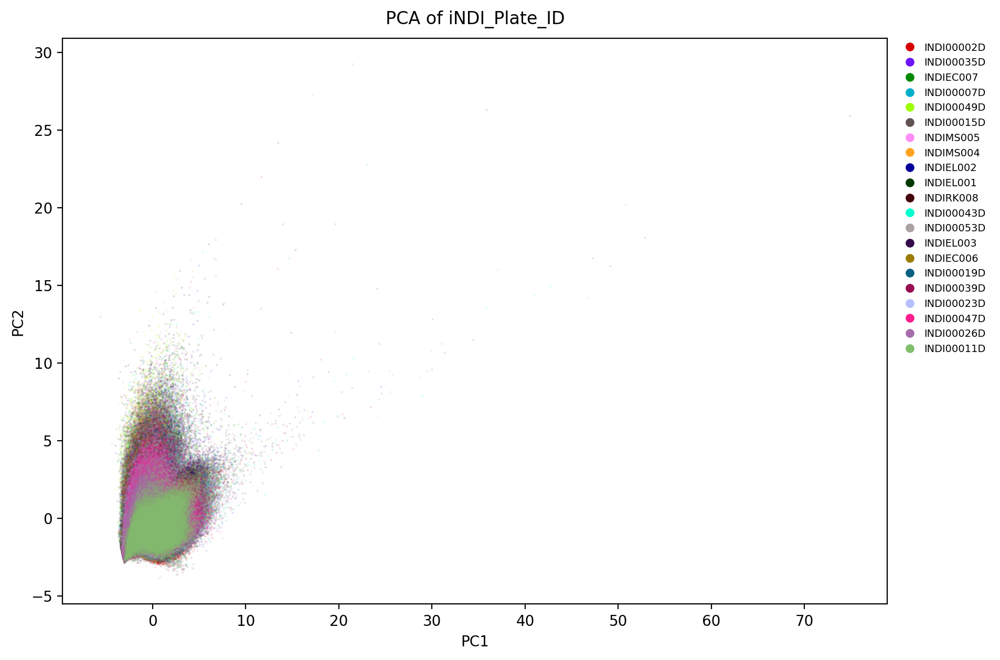

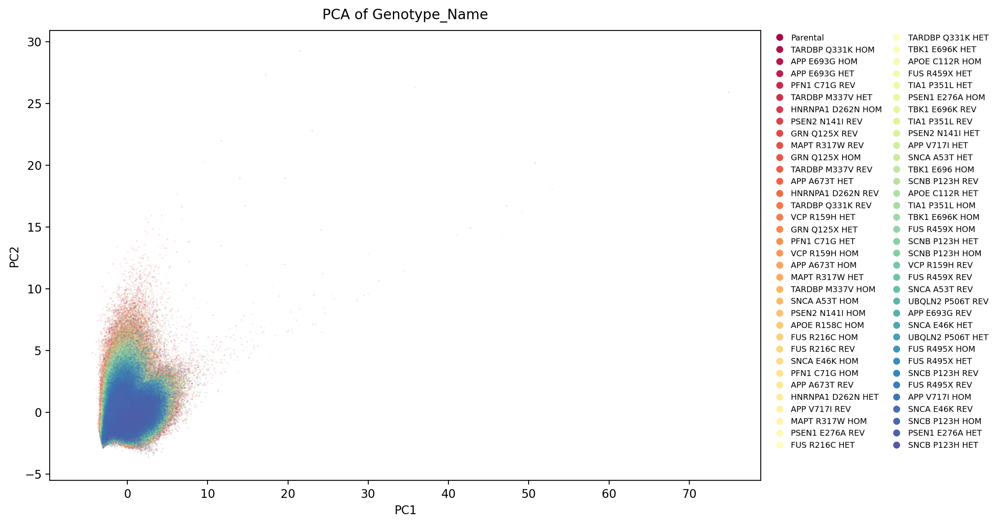

In [100]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import ListedColormap
import seaborn as sns
import glasbey

STRUCTURE_COLORS = {
    "DAPI":   "#5b3f78",
    "Endosome":   "#8c6239",
    "Lysosome":  "#9acd32",
    "Mitochondria": "#ff4fb3",
}

# create a glasbey palette like your colleague
palette = glasbey.create_palette(
    palette_size=29,
    hue_bounds=(-380.0, 330.0),
    chroma_bounds=(0, 680),
)
glasbey_cmap = ListedColormap(palette)
glasbey_colors = [glasbey_cmap(i) for i in range(len(palette))]

def pca_scatter(
    df,
    color_col,
    pcx="PC1",
    pcy="PC2",
    palette=None,
    max_cats=None,
    s=2,
    alpha=0.15,
    figsize=(10, 7),
    legend_ncol=1,
    title=None,
):
    fig, ax = plt.subplots(figsize=figsize, dpi=200)
    fig.subplots_adjust(right=0.78)

    vals = df[color_col].astype("object")
    cats = vals.value_counts().index.tolist()

    if max_cats is not None and len(cats) > max_cats:
        cats = cats[:max_cats]

    # choose colors
    if palette is not None:
        colors = [palette.get(c, "#808080") for c in cats]
    elif color_col == "Genotype_Name":
        colors = sns.color_palette("Spectral", n_colors=len(cats))
    elif color_col == "iNDI_Plate_ID":
        # use glasbey colors so 21+ plates stay distinct
        colors = glasbey_colors[:len(cats)]
    elif color_col == "Structure":
        colors = [STRUCTURE_COLORS.get(c, "#808080") for c in cats]
    else:
        colors = sns.color_palette("husl", n_colors=len(cats))

    # scatter points
    for c, col in zip(cats, colors):
        m = vals == c
        ax.scatter(
            df.loc[m, pcx],
            df.loc[m, pcy],
            s=s,
            alpha=alpha,
            color=col,
            linewidths=0,
            rasterized=True,
        )

    ax.set_xlabel(pcx)
    ax.set_ylabel(pcy)
    ax.set_title(title or f"PCA of {color_col}", pad=10)

    # opaque legend markers
    handles = [
        Line2D(
            [0], [0],
            marker="o",
            linestyle="",
            markersize=5,
            markerfacecolor=col,
            markeredgecolor=col,
            alpha=1.0,
            label=str(c),
        )
        for c, col in zip(cats, colors)
    ]

    ax.legend(
        handles=handles,
        loc="upper left",
        bbox_to_anchor=(1.01, 1.0),
        frameon=False,
        fontsize=7,
        ncol=legend_ncol,
        borderaxespad=0.0,
        handletextpad=0.4,
        columnspacing=0.8,
    )

    plt.show()

df_shuf = df.sample(frac=1, random_state=0).reset_index(drop=True)

pca_scatter(df_shuf, "Structure", palette=STRUCTURE_COLORS, s=2, alpha=0.15, figsize=(9, 7), title="PCA of Structure")
pca_scatter(df_shuf, "prep_method", s=2, alpha=0.15, figsize=(9, 7), title="PCA of prep_method")
pca_scatter(df_shuf, "iNDI_Plate_ID", s=2, alpha=0.15, figsize=(12, 7), title="PCA of iNDI_Plate_ID")
pca_scatter(df_shuf, "Genotype_Name", s=2, alpha=0.15, figsize=(13, 7), title="PCA of Genotype_Name", legend_ncol=2)

In [101]:
import pandas as pd

WELL_KEYS  = ["Measurement_ID", "subdirectory"]
IMAGE_KEY  = "DAPI_filename"
STRUCT_KEY = "Structure"

# metadata columns to carry through (identical within a group) — take .first()
# everything that isn't a feature, a PC, or a grouping key
GROUP_KEYS = [STRUCT_KEY, *WELL_KEYS, IMAGE_KEY]
DROP_COLS  = set(FEATURES) | {"PC1", "PC2", "PC3"} | set(GROUP_KEYS) \
             | {"Nucleus_ID", "channel_filename"}   # per-ROI, not meaningful post-agg
META_COLS  = [c for c in df.columns if c not in DROP_COLS]

# --- stage 1: median across ROIs within each image (per structure) ---
agg_image = {**{f: "median" for f in FEATURES},
             **{m: "first" for m in META_COLS}}
image_level = (
    df.groupby(GROUP_KEYS, as_index=False)
      .agg(agg_image)
)
print(f"Image-level: {len(image_level)} rows "
      f"({df[IMAGE_KEY].nunique()} images x {df[STRUCT_KEY].nunique()} structures)")

# --- stage 2: mean across images within each well (per structure) ---
WELL_GROUP = [STRUCT_KEY, *WELL_KEYS]
agg_well = {**{f: "mean" for f in FEATURES},
            **{m: "first" for m in META_COLS}}
well_level = (
    image_level.groupby(WELL_GROUP, as_index=False)
      .agg(agg_well)
)
print(f"Well-level: {len(well_level)} rows")
print(well_level.head())

Image-level: 599159 rows (13440 images x 3 structures)
Well-level: 19056 rows
  Structure                        Measurement_ID subdirectory     area_px  \
0  Endosome  028ebee9-afaf-4ff8-b435-af11714285dc       r02c03  547.828571   
1  Endosome  028ebee9-afaf-4ff8-b435-af11714285dc       r02c04  576.439394   
2  Endosome  028ebee9-afaf-4ff8-b435-af11714285dc       r02c05  574.757143   
3  Endosome  028ebee9-afaf-4ff8-b435-af11714285dc       r02c06  646.971429   
4  Endosome  028ebee9-afaf-4ff8-b435-af11714285dc       r02c07  648.590909   

   organelle_count  average_organelle_area  sum_f_intensity  mean_f_intensity  \
0        28.257143               18.305175     4.176576e+06       7200.389388   
1        26.257576               21.559397     5.290156e+06       9082.195201   
2        31.342857               18.276927     3.709554e+06       6465.318314   
3        28.471429               22.194321     5.405958e+06       8150.295209   
4        25.984848               23.100952     5

Well-level PCA on 19056 rows (dropped 0 with NaN)
Well-level PC1-3: [0.425 0.254 0.179] cumulative: [0.425 0.679 0.858]


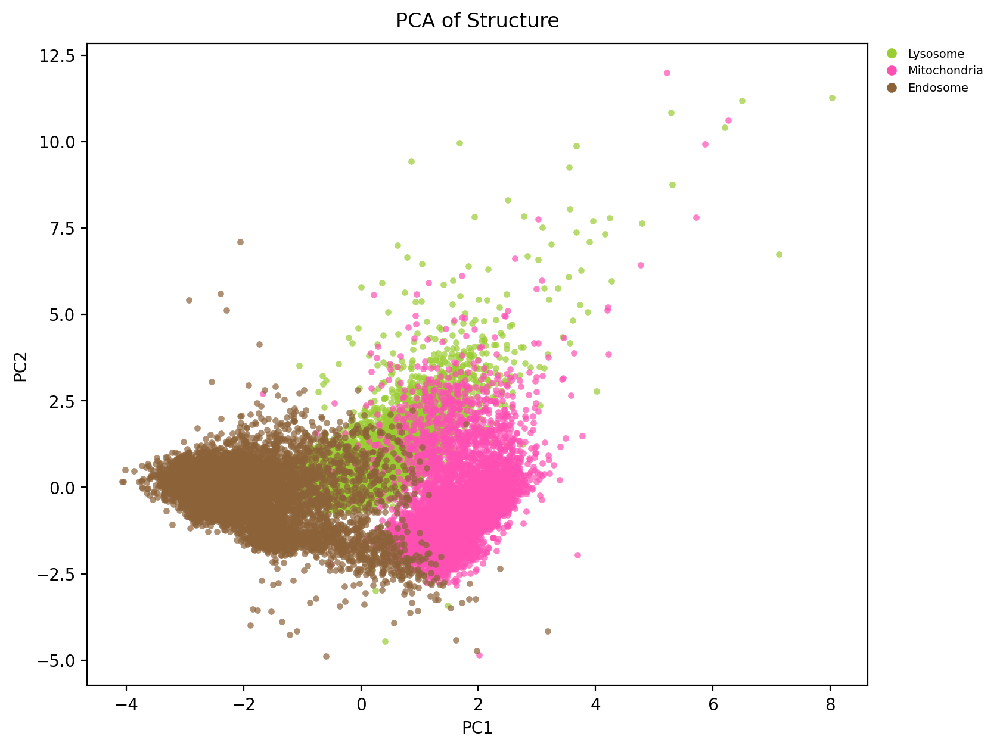

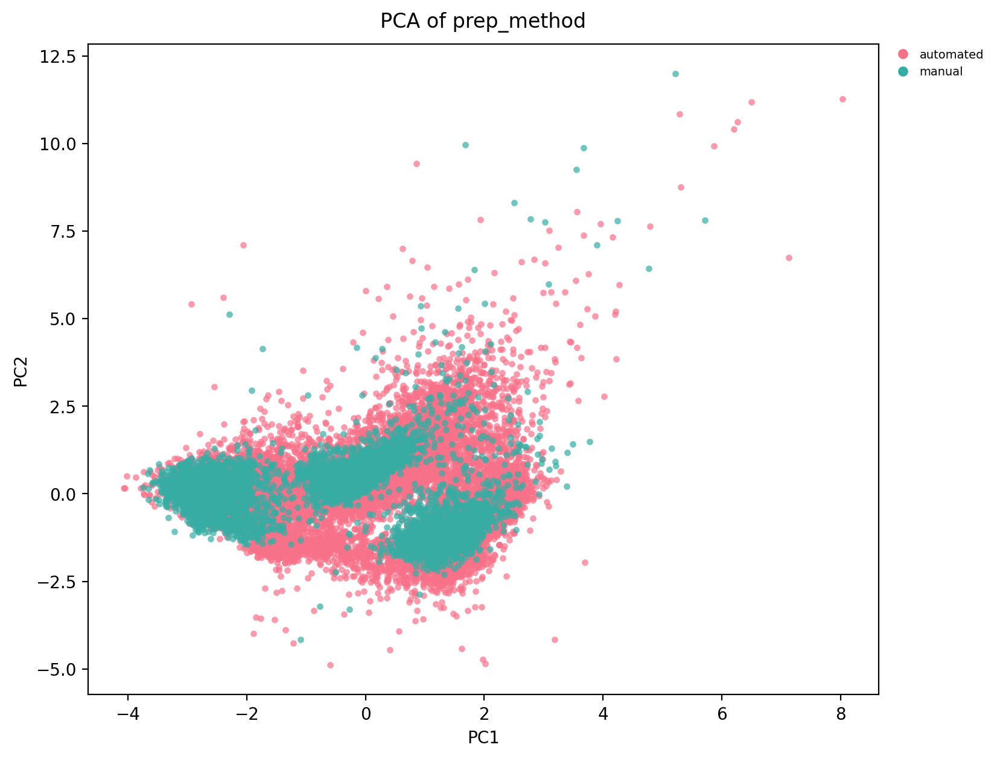

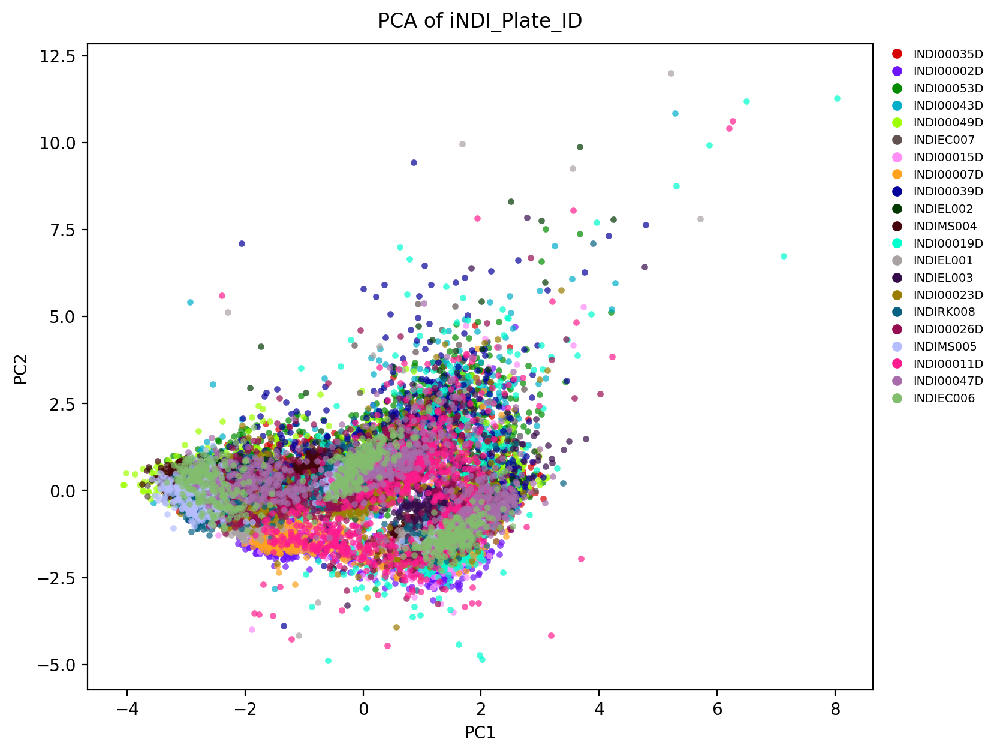

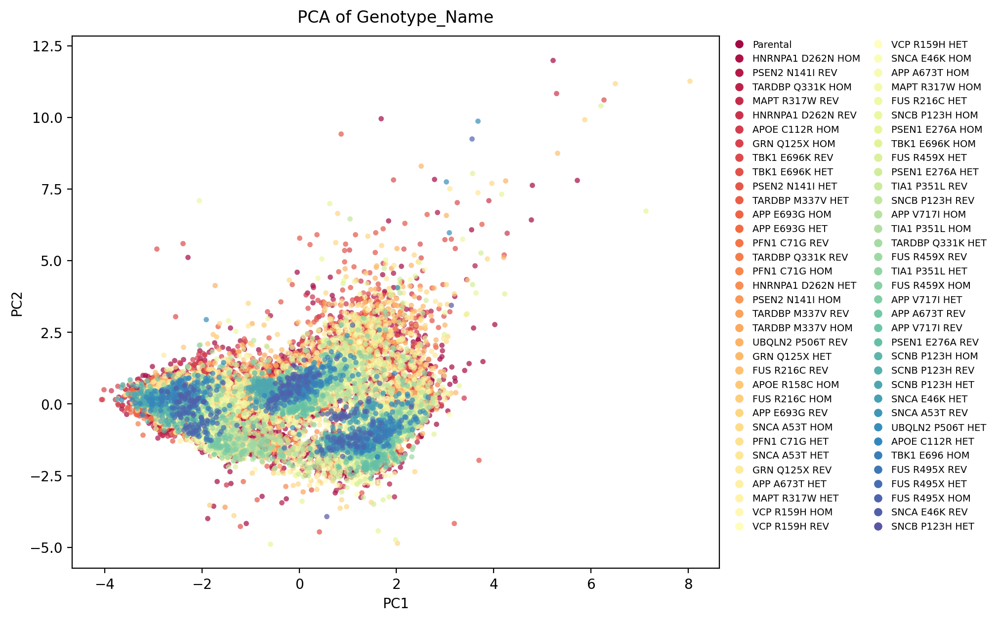

In [102]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# fit PCA on the WELL-LEVEL aggregated features (each row = one well x structure)
Xw_df = well_level[FEATURES].replace([np.inf, -np.inf], np.nan)
keep = Xw_df.notna().all(axis=1)
well_level = well_level[keep].reset_index(drop=True)
Xw_df = Xw_df[keep].reset_index(drop=True)
print(f"Well-level PCA on {len(well_level)} rows "
      f"(dropped {(~keep).sum()} with NaN)")

Xw = StandardScaler().fit_transform(Xw_df.values)
pca_well = PCA(n_components=len(FEATURES))
scores_w = pca_well.fit_transform(Xw)
well_level["PC1"], well_level["PC2"], well_level["PC3"] = \
    scores_w[:, 0], scores_w[:, 1], scores_w[:, 2]

# scree + explained variance
evw = pca_well.explained_variance_ratio_
print("Well-level PC1-3:", evw[:3].round(3), "cumulative:", np.cumsum(evw)[:3].round(3))

# reuse your scatter + palette
pca_well_shuf = well_level.sample(frac=1, random_state=0).reset_index(drop=True)
pca_scatter(pca_well_shuf, "Structure", palette=STRUCTURE_COLORS, s=15, alpha=0.7)
pca_scatter(pca_well_shuf, "prep_method", s=15, alpha=0.7, title="PCA of prep_method")
pca_scatter(pca_well_shuf, "iNDI_Plate_ID", s=15, alpha=0.7, title="PCA of iNDI_Plate_ID")
pca_scatter(pca_well_shuf, "Genotype_Name", s=15, alpha=0.7, title="PCA of Genotype_Name", legend_ncol=2)

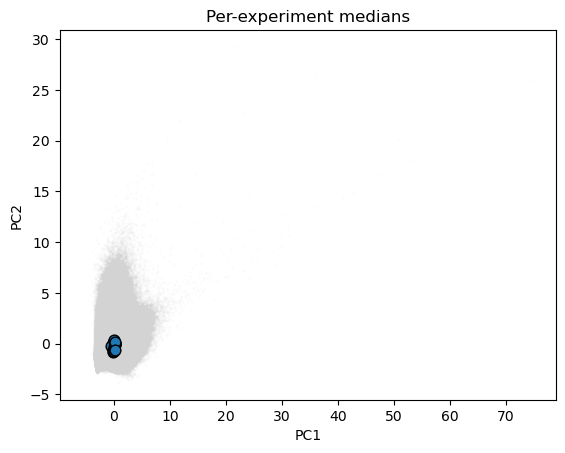

/data/kelpschdj/conda/envs/indi_project/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


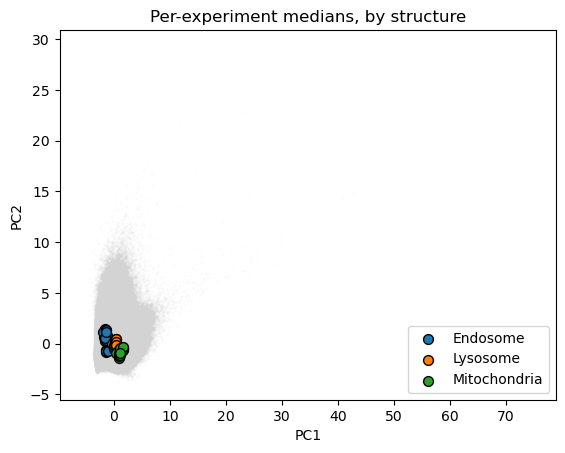

In [103]:
# experiment centroids in PC space — on your current (raw) PCA
cent = df.groupby("Measurement_ID")[["PC1", "PC2"]].median()
plt.scatter(df["PC1"], df["PC2"], s=1, alpha=0.03, color="lightgray")
plt.scatter(cent["PC1"], cent["PC2"], s=60, edgecolor="k")
plt.xlabel("PC1"); plt.ylabel("PC2"); plt.title("Per-experiment medians")
plt.show()

cent = df.groupby(["Measurement_ID", "Structure"])[["PC1", "PC2"]].median().reset_index()
plt.scatter(df["PC1"], df["PC2"], s=1, alpha=0.03, color="lightgray")
for st, g in cent.groupby("Structure"):
    plt.scatter(g["PC1"], g["PC2"], s=50, edgecolor="k", label=st)
plt.legend(); plt.xlabel("PC1"); plt.ylabel("PC2")
plt.title("Per-experiment medians, by structure"); plt.show()

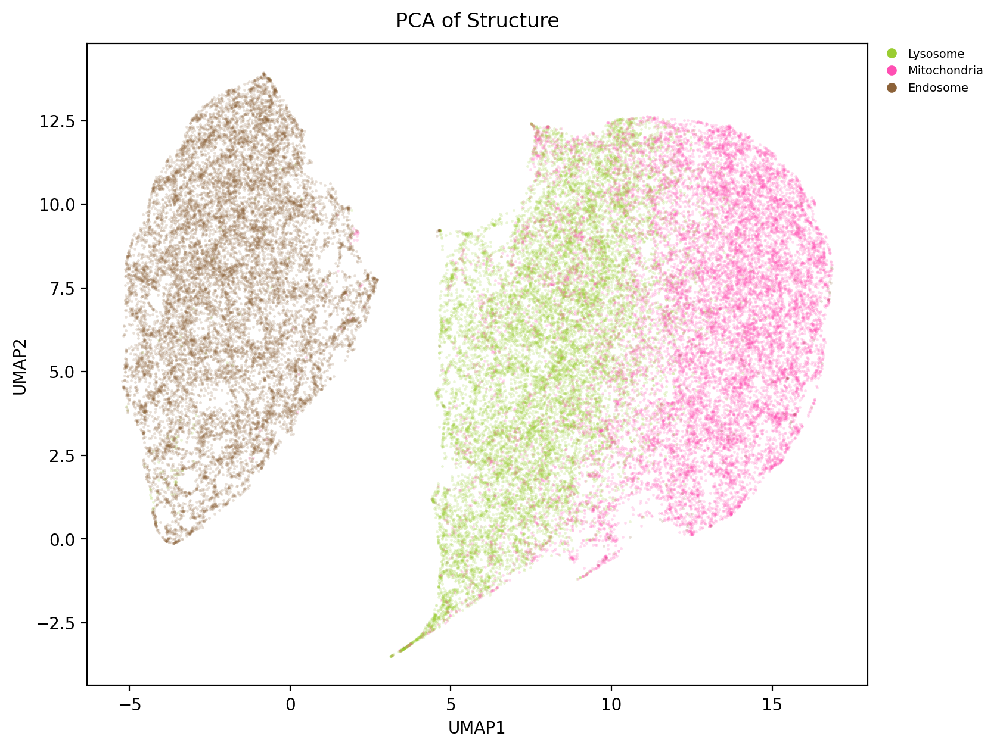

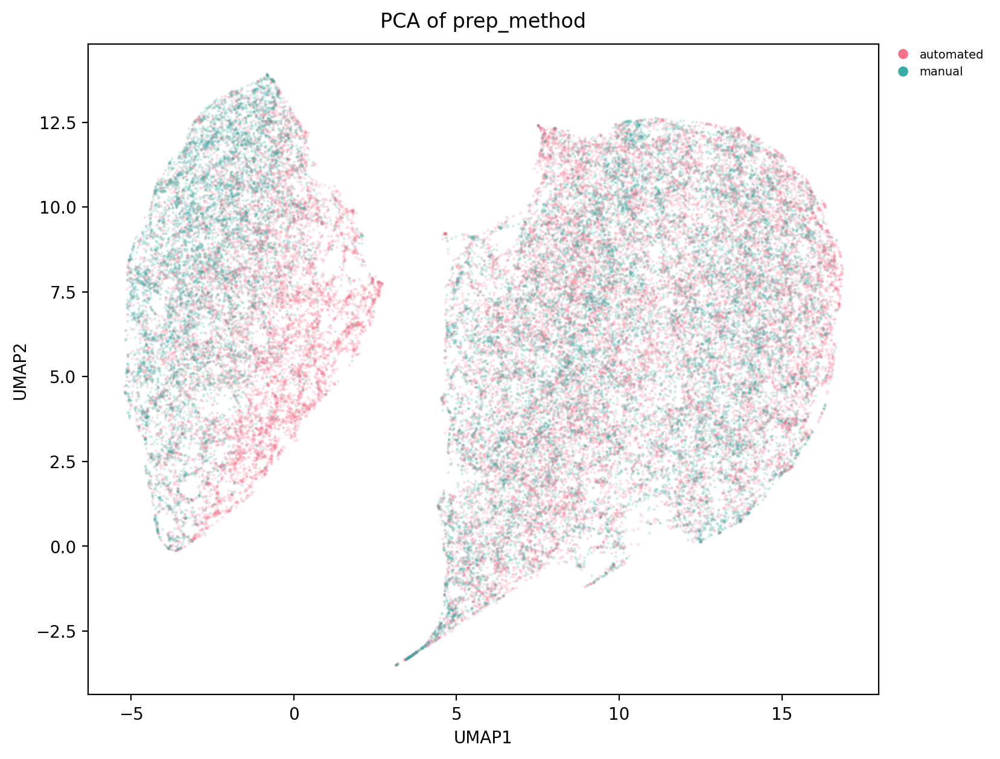

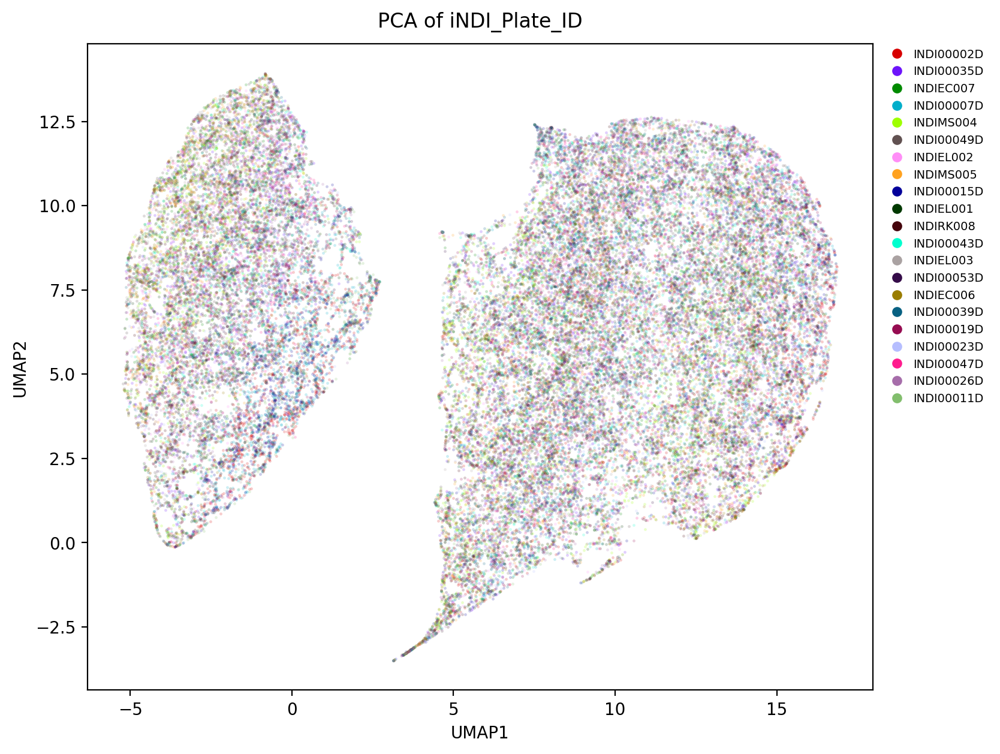

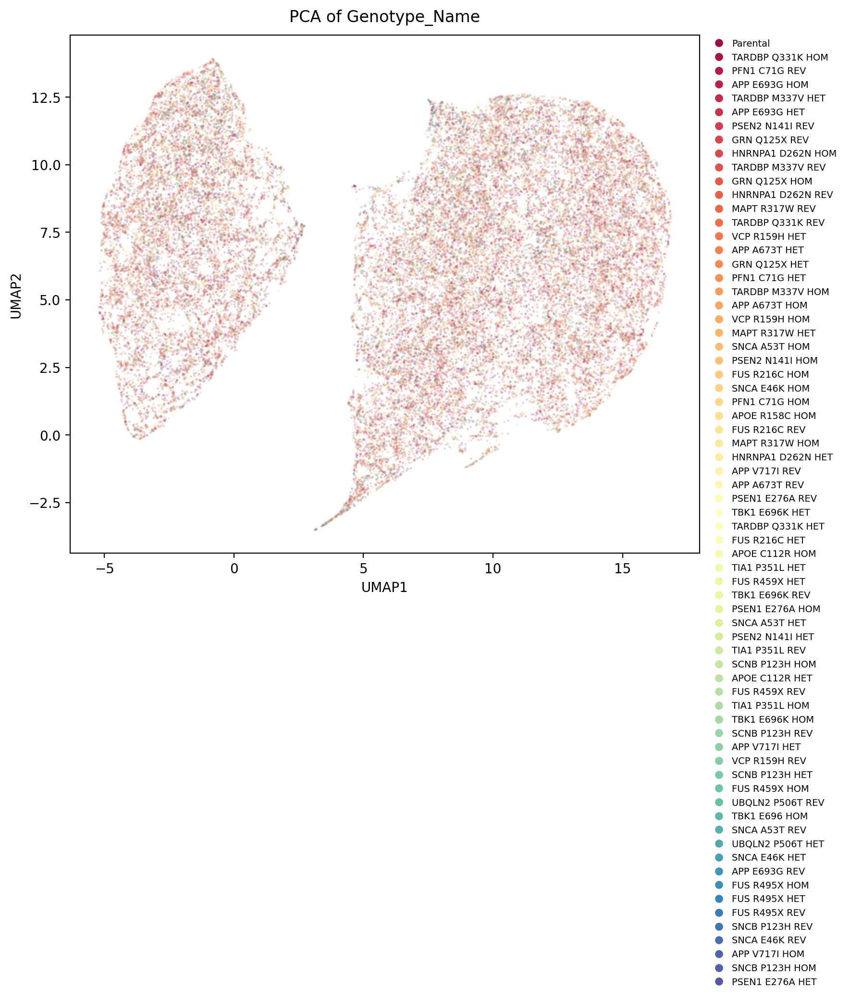

In [104]:
import umap

# reuse the SAME standardized features as the PCA (X from StandardScaler)
# if X isn't still in scope, rebuild it:
# X = StandardScaler().fit_transform(df[FEATURES].values)

sub = df.sample(50000, random_state=0).reset_index(drop=True)
Xsub = StandardScaler().fit_transform(sub[FEATURES].values)
emb = umap.UMAP(n_neighbors=15, min_dist=0.1).fit_transform(Xsub)
sub["UMAP1"], sub["UMAP2"] = emb[:, 0], emb[:, 1]
pca_scatter(sub, "Structure", pcx="UMAP1", pcy="UMAP2",
            palette=STRUCTURE_COLORS, s=3, alpha=0.2)
pca_scatter(sub.sample(frac=1, random_state=0).reset_index(drop=True),
            "prep_method", pcx="UMAP1", pcy="UMAP2", s=3, alpha=0.2)
pca_scatter(sub.sample(frac=1, random_state=0).reset_index(drop=True),
            "iNDI_Plate_ID", pcx="UMAP1", pcy="UMAP2", s=3, alpha=0.2)
pca_scatter(sub.sample(frac=1, random_state=0).reset_index(drop=True),
            "Genotype_Name", pcx="UMAP1", pcy="UMAP2", s=3, alpha=0.2)

t-SNE on 25000 rows in 41s


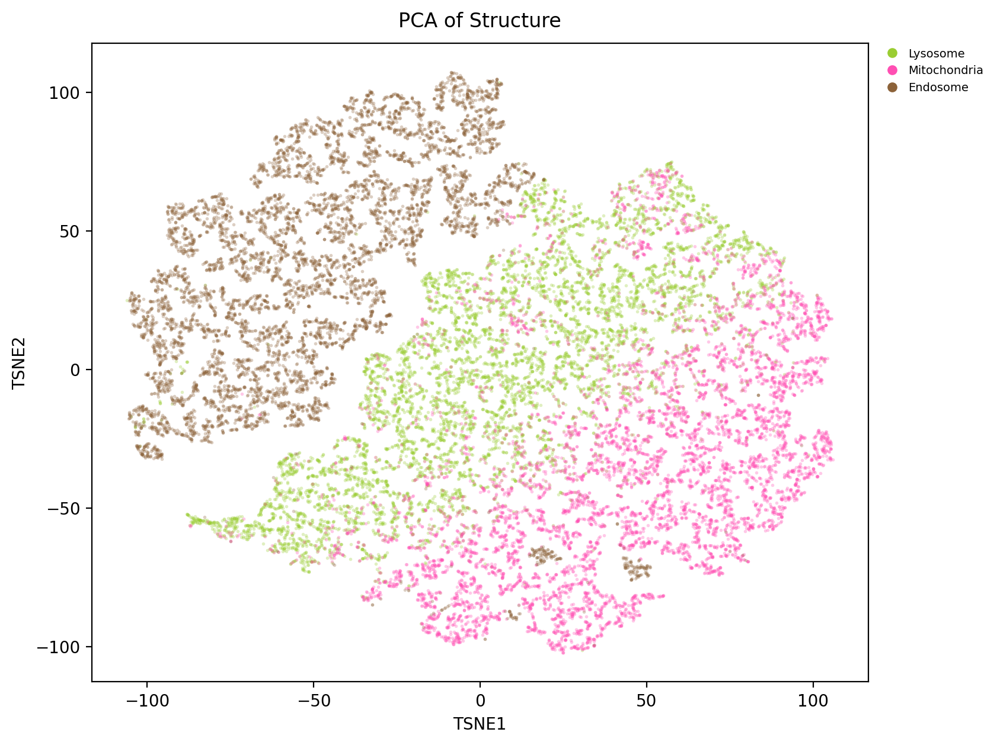

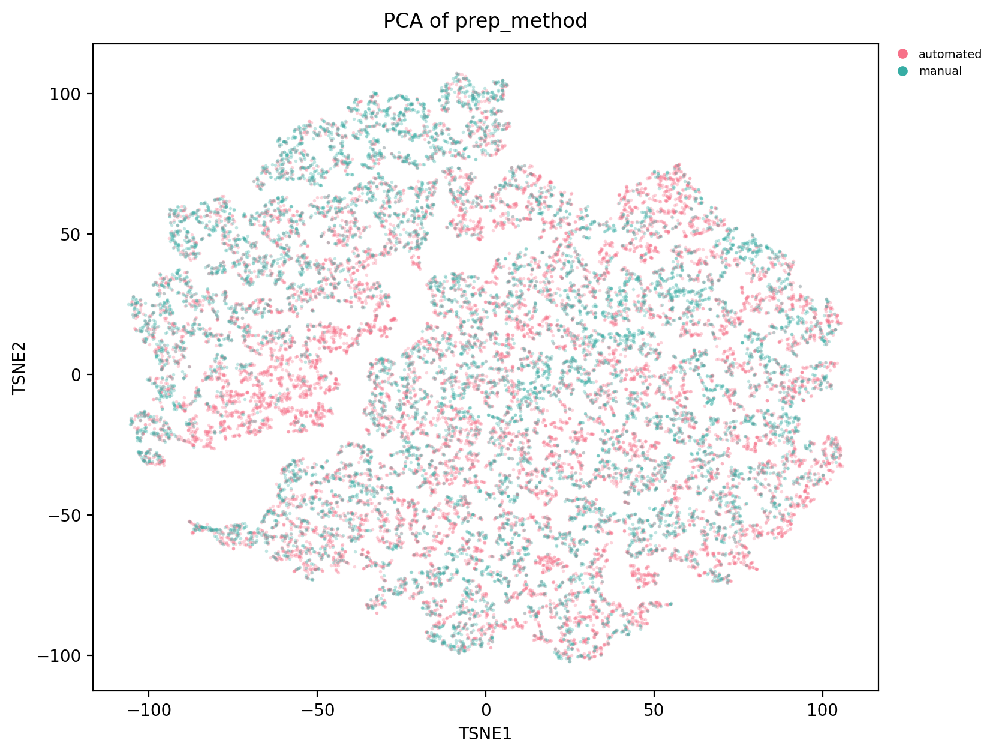

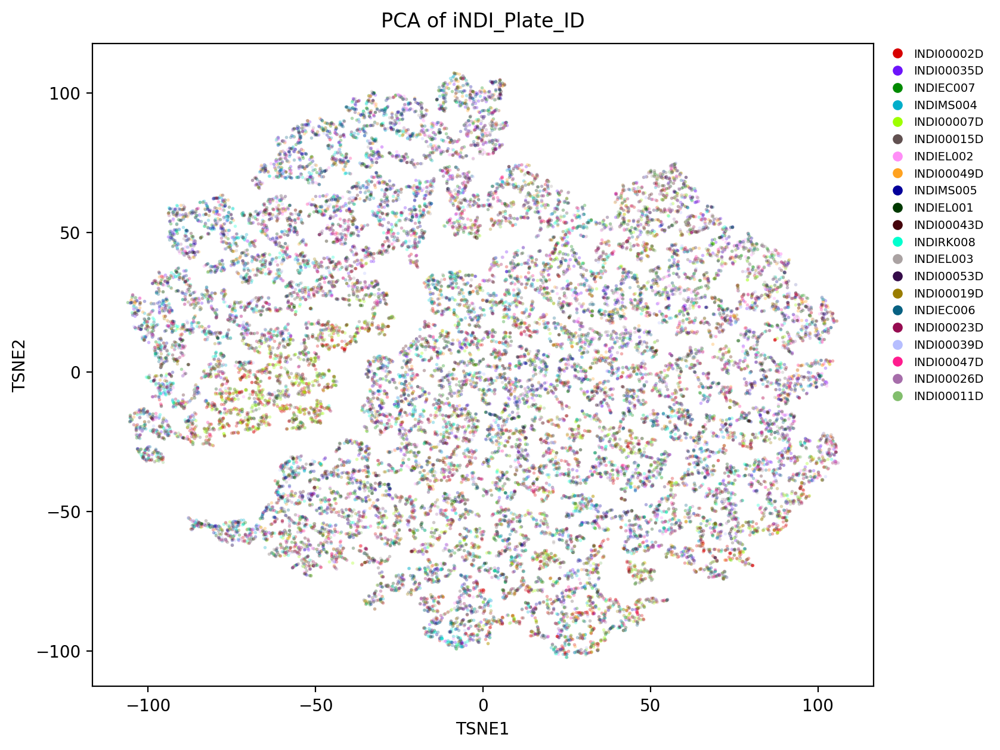

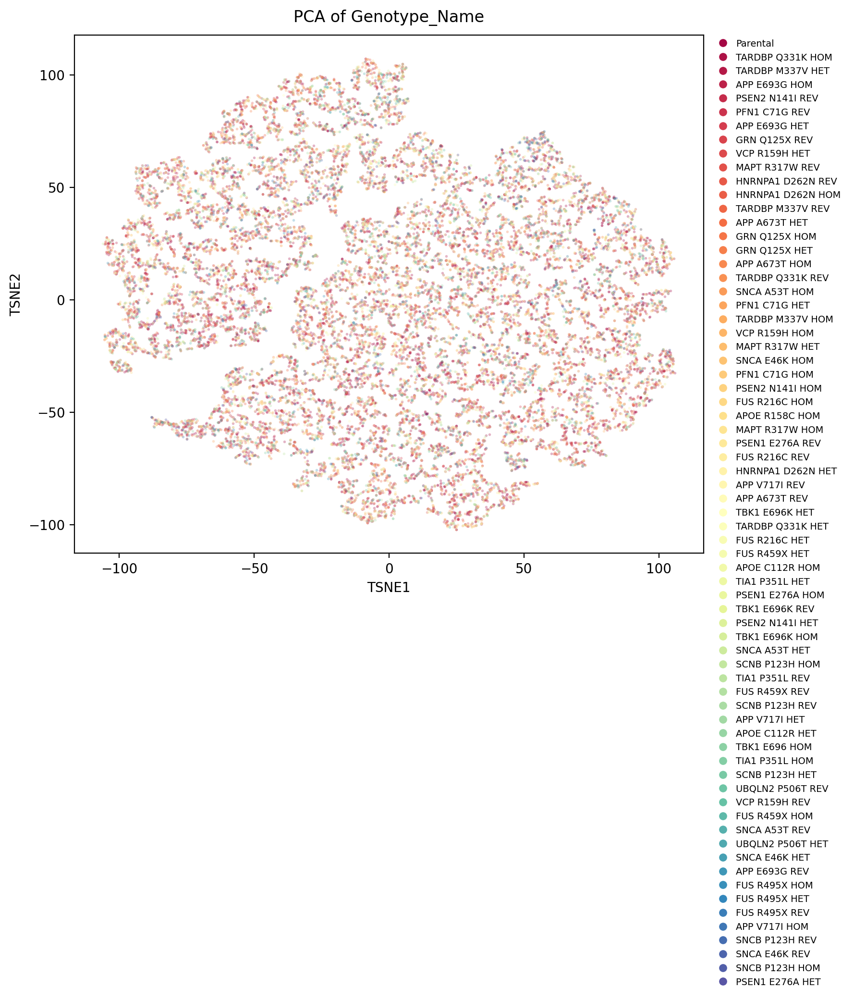

In [105]:
from sklearn.manifold import TSNE

# t-SNE is O(n^2)-ish — subsample MORE aggressively than UMAP
sub_t = df.sample(25000, random_state=0).reset_index(drop=True)
Xt = StandardScaler().fit_transform(sub_t[FEATURES].values)

import time; t = time.time()
tsne = TSNE(
    n_components=2,
    perplexity=30,        # local/global balance; try 30-50
    init="pca",           # faster, more stable than random init
    learning_rate="auto",
    n_jobs=-1,            # use all cores
    random_state=42,
)
emb_t = tsne.fit_transform(Xt)
print(f"t-SNE on {len(sub_t)} rows in {time.time()-t:.0f}s")

sub_t["TSNE1"], sub_t["TSNE2"] = emb_t[:, 0], emb_t[:, 1]

# structure
pca_scatter(sub_t.sample(frac=1, random_state=0).reset_index(drop=True),
            "Structure", pcx="TSNE1", pcy="TSNE2",
            palette=STRUCTURE_COLORS, s=4, alpha=0.3)
pca_scatter(sub_t.sample(frac=1, random_state=0).reset_index(drop=True),
            "prep_method", pcx="TSNE1", pcy="TSNE2", s=4, alpha=0.3)
pca_scatter(sub_t.sample(frac=1, random_state=0).reset_index(drop=True),
            "iNDI_Plate_ID", pcx="TSNE1", pcy="TSNE2", s=4, alpha=0.3)
pca_scatter(sub_t.sample(frac=1, random_state=0).reset_index(drop=True),
            "Genotype_Name", pcx="TSNE1", pcy="TSNE2", s=4, alpha=0.3)

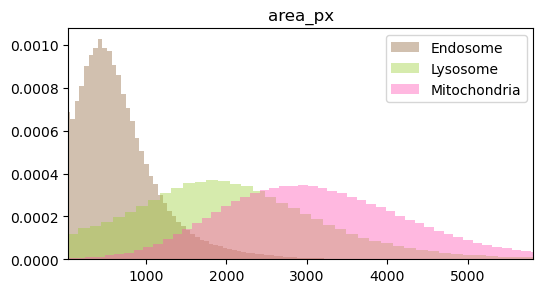

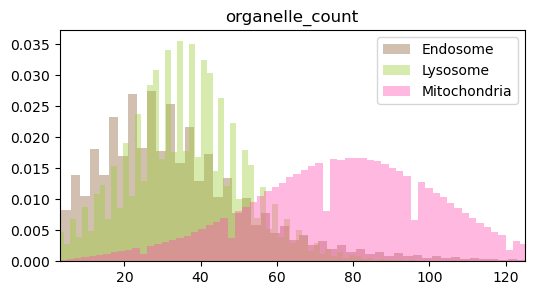

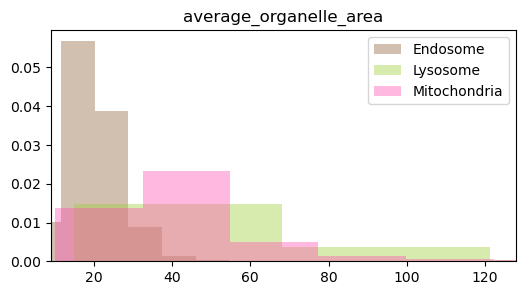

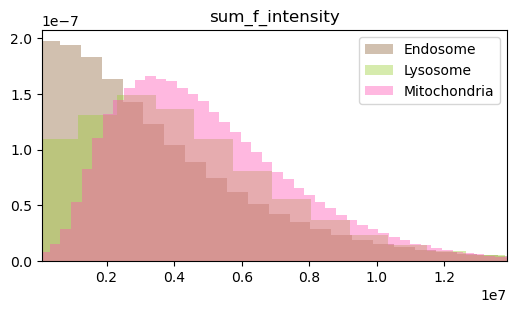

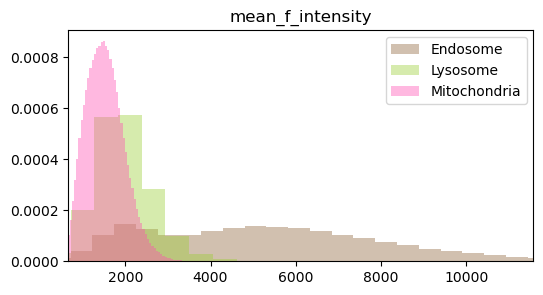

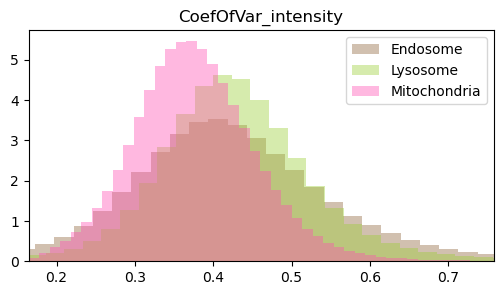

In [106]:
for feat in FEATURES:
    fig, ax = plt.subplots(figsize=(6, 3))
    for st in ["Endosome", "Lysosome", "Mitochondria"]:
        vals = df.loc[df["Structure"] == st, feat]
        ax.hist(vals, bins=100, alpha=0.4, density=True,
                label=st, color=STRUCTURE_COLORS[st])
    ax.set_title(feat); ax.legend()
    # xlim from ALL structures, not just the last one in the loop
    allvals = df[feat]
    ax.set_xlim(allvals.quantile(0.01), allvals.quantile(0.99))
    plt.show()

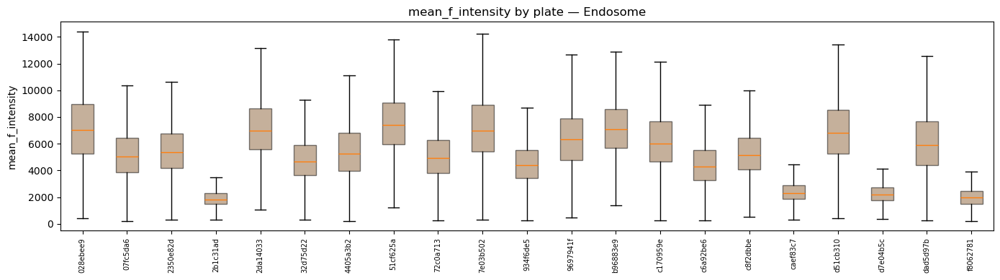

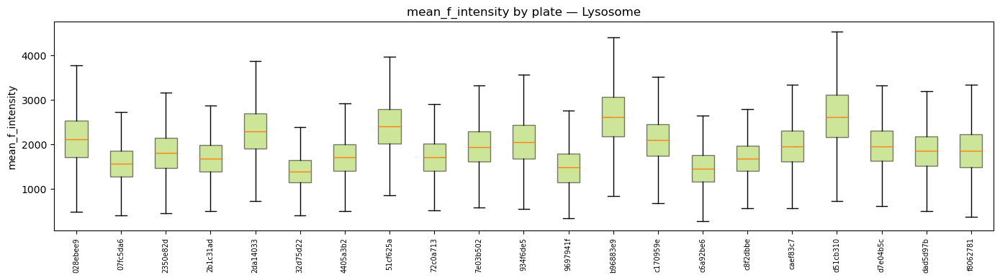

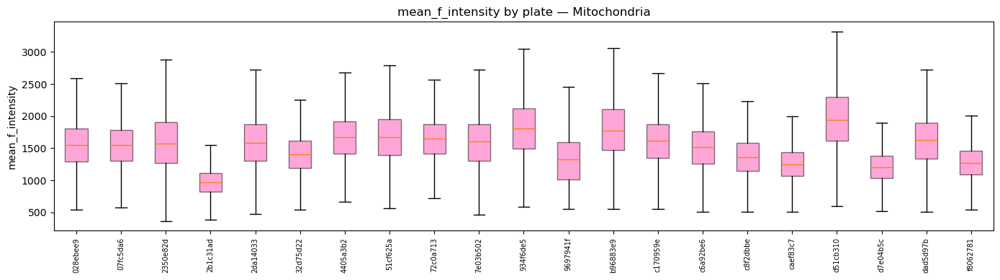

In [107]:
import matplotlib.pyplot as plt

PLATE_COL = "Measurement_ID"   # swap to "Plate_ID" if you have it
FEAT = "mean_f_intensity"

for st in ["Endosome", "Lysosome", "Mitochondria"]:
    sub = df[df["Structure"] == st]
    plates = sorted(sub[PLATE_COL].unique())
    data = [sub.loc[sub[PLATE_COL] == p, FEAT].values for p in plates]

    fig, ax = plt.subplots(figsize=(14, 4))
    bp = ax.boxplot(data, showfliers=False, patch_artist=True)
    for box in bp["boxes"]:
        box.set(facecolor=STRUCTURE_COLORS[st], alpha=0.5)
    ax.set_xticks(range(1, len(plates) + 1))
    ax.set_xticklabels([p[:8] for p in plates], rotation=90, fontsize=7)
    ax.set_ylabel(FEAT); ax.set_title(f"{FEAT} by plate — {st}")
    plt.tight_layout(); plt.show()